# Warp Consistency for LoFTR Matches

In [1]:
import kornia as K
import kornia.augmentation as KA
import matplotlib.pyplot as plt
import numpy as np
import math
import torch

from leafalignment.utils import convert_image_to_tensor, match_sizes_resize, group_by_argmax
from leafalignment.DatasetTools.LeafImageSeries import LeafDataset
from leafalignment.masking import fetch_image_mask_pair
from leafalignment.loftr import loftr_match, filter_matches_by_confidence, fit_tps_torch, warp_tps_torch, warp_tps_points_torch, torch_tps
from leafalignment.plotting import plot_image_pair, plot_overlay, plot_match_coverage, plot_img_transform, plot_matches, plot_matches_conf

In [2]:
leaf = LeafDataset(
    base_dir='../../leaf-image-sequences',
    # leaf_uid="ESWW0070020_1",
    leaf_uid="ESWW0070020_2", # very drastic changes
    # leaf_uid="ESWW0070040_6", # has much missing data 
    load=('roi_leaf_masks'),
    verbose=False
)

Processing series: 100%|██████████| 15/15 [00:11<00:00,  1.27it/s]


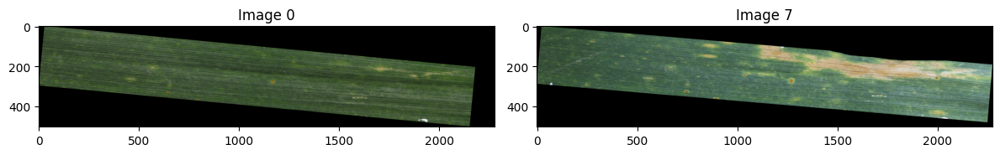

In [3]:
fix_ind = 0
# mov_ind = 2 # easy example
mov_ind = 7 # hard example
# mov_ind = 14 # very hard example
# mov_ind = 9
img_fixed, mask_fixed = fetch_image_mask_pair(leaf, fix_ind, img_scale="roi")
img_moving, mask_moving = fetch_image_mask_pair(leaf, mov_ind, img_scale="roi")
img_fixed, img_moving, mask_fixed, mask_moving = match_sizes_resize(img_fixed, img_moving, mask_fixed, mask_moving)
_ = plot_image_pair(img_fixed, img_moving, fix_ind, mov_ind)

### Random Warp

In [54]:
class RandomHomography:
    def __init__(
        self,
        height,
        width,
        distortion_scale=0.5,
        device="cpu",
        dtype=torch.float32,
    ):
        self.height = height
        self.width = width

        self.aug = K.augmentation.RandomPerspective(
            distortion_scale=distortion_scale,
            p=1.0,
            same_on_batch=True,
            keepdim=True,
        ).to(device=device, dtype=dtype)

        # sample once on dummy input to fix parameters
        dummy = torch.zeros(1, 1, height, width, device=device, dtype=dtype)
        self.aug(dummy)
        self.params = self.aug._params
        # self.params = self.aug.forward_parameters(dummy.shape)

        self.H, self.H_inv = self._compute_matrices()
        

    def _compute_matrices(self):
        start = self.params["start_points"]  # (1, 4, 2)
        end = self.params["end_points"]      # (1, 4, 2)

        H = K.geometry.transform.get_perspective_transform(start, end)
        H_inv = torch.inverse(H)

        return H, H_inv

    # -----------------------
    # Image warping
    # -----------------------
    def warp_image(self, x):
        return self.aug(x, params=self.params)

    def warp_image_inverse(self, x):
        return self.aug.inverse(x, params=self.params)

    # -----------------------
    # Points warping
    # -----------------------
    def warp_points(self, points):
        """
        points: (B, N, 2)
        """
        pts_dim = points.dim()
        if pts_dim == 2:
            points = points.unsqueeze(0)
        B = points.shape[0]
        H = self.H.expand(B, -1, -1)
        out = K.geometry.linalg.transform_points(H, points)
        if pts_dim == 2:
            out = out.squeeze(0)
        return out


    def warp_points_inverse(self, points):
        pts_dim = points.dim()
        if pts_dim == 2:
            points = points.unsqueeze(0)
        B = points.shape[0]
        H = self.H_inv.expand(B, -1, -1)
        out = K.geometry.linalg.transform_points(H, points)
        if pts_dim == 2:
            out = out.squeeze(0)
        return out
        
    # -----------------------
    def matrix(self):
        return self.H

    def inverse_matrix(self):
        return self.H_inv

In [59]:
homogr = RandomHomography(img_fixed.shape[2], img_fixed.shape[3], distortion_scale=0.30)

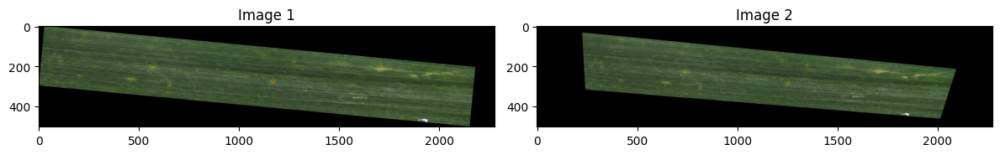

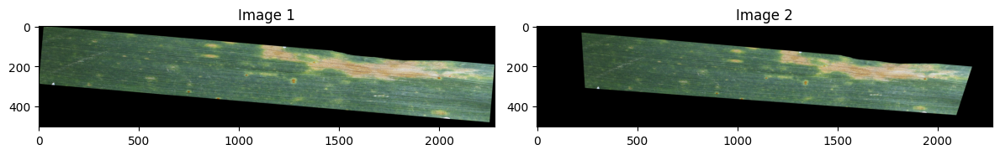

In [60]:
fix_warp = homogr.warp_image(img_fixed)
_=plot_image_pair(img_fixed, fix_warp)
mov_warp = homogr.warp_image(img_moving)
_=plot_image_pair(img_moving, mov_warp)

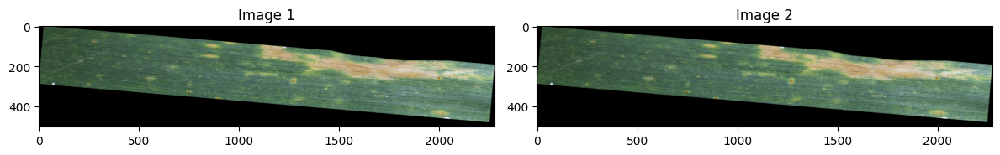

In [13]:
# inversion?
fix_inv = homogr.warp_image_inverse(fix_warp)
mov_inv = homogr.warp_image_inverse(mov_warp)
_=plot_image_pair(img_moving, mov_inv)

Total Difference between original image and after inverted homography: 47331.355
Total Difference between original image and after inverted homography: 34879.461


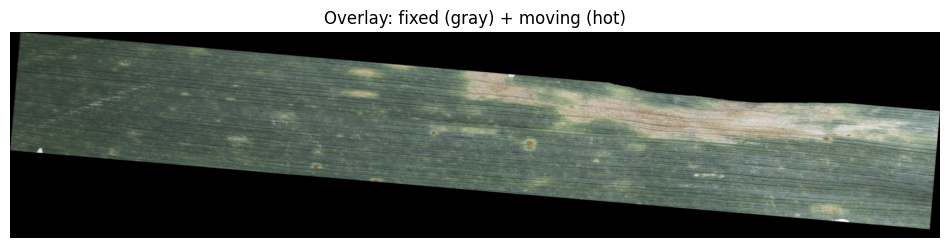

In [14]:
print(f"Total Difference between original image and after inverted homography: {torch.sum(torch.abs(img_moving - mov_inv)):.3f}")
print(f"Total Difference between original image and after inverted homography: {torch.sum(torch.abs(img_fixed - fix_inv)):.3f}")
_=plot_overlay(img_moving, mov_inv)

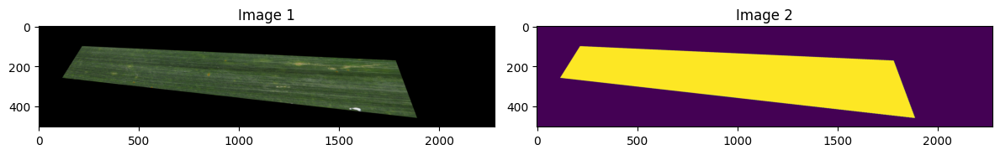

In [15]:
# does it work on masks?
fix_mask_warp = homogr.warp_image(mask_fixed)
_=plot_image_pair(fix_warp, fix_mask_warp)

496


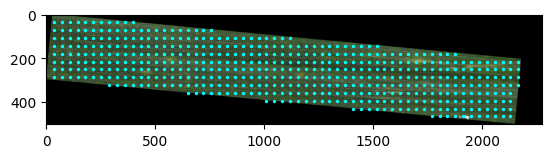

In [16]:
def sample_landmarks_grid(mask, n):
    mask = mask[0,0,:]
    H, W = mask.shape
    valid_area = torch.sum(mask)
    total_area = H * W
    coverage = valid_area / total_area
    ratio = H/W

    # points that fall outside the mask are lost -> generate more points to account for this
    N = n / coverage
    kW = math.ceil( (N/ratio)**0.5)
    kH = math.ceil(ratio*kW)
    
    xs = torch.linspace(0, W-1, kW) 
    ys = torch.linspace(0, H-1, kH)
    
    grid_x, grid_y = torch.meshgrid(xs, ys, indexing="xy")
    pts = torch.stack([grid_x.flatten(), grid_y.flatten()], dim=1)

    mask_values = mask[pts[:,1].long(), pts[:,0].long()]
    pts = pts[mask_values > 0]

    return pts[:n]

kpts = sample_landmarks_grid(mask_fixed, 500)
print(len(kpts))
plt.imshow(K.tensor_to_image(img_fixed))
plt.scatter(kpts[:,0], kpts[:,1], s=2, color='cyan')
plt.show()

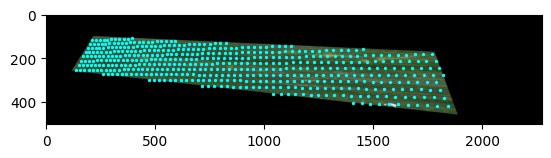

In [17]:
kpts_warp = homogr.warp_points(kpts)
plt.imshow(K.tensor_to_image(fix_warp))
plt.scatter(kpts_warp[:,0], kpts_warp[:,1], s=2, color='cyan')
plt.show()

In [18]:
kpts_inv = homogr.warp_points_inverse(kpts_warp)
print(f"Total Difference: {torch.sum(torch.abs(kpts_inv-kpts)):.4f}")
print(f"All within Tolerance? {torch.allclose(kpts, kpts_inv, atol=1e-4)}")

Total Difference: 0.3682
All within Tolerance? True


### Find nearest neighbor

For two lists of match coordinates `pts1` and `pts2` both "living" in the same image, we want to find the nearest neighbor in `pts2` for each point in pts1.

In [33]:
def nearest_neighbors(pts1, pts2):
    """
    pts1: (N, D)
    pts2: (M, D)

    Returns:
        Tensor of indices, such that pts2[indices[i]] is the nearest neighbor of pts[i]
    """
    # pairwise distances: dists[i,j] = dist(pts1[i], pts2[j])
    dists = torch.cdist(pts1, pts2)  # (N, M)

    # nearest neighbor in pts2 for each pts1
    min_dists, indices = torch.min(dists, dim=1)

    return indices#, min_dists

In [19]:
pts1 = torch.Tensor([[0,0], [0,1], [1,1]])
pts2 = torch.Tensor([[1,1], [0,0], [0,1]])
pts1, pts2

(tensor([[0., 0.],
         [0., 1.],
         [1., 1.]]),
 tensor([[1., 1.],
         [0., 0.],
         [0., 1.]]))

In [20]:
dists = torch.cdist(pts1, pts2)
dists
# => cdist[i,j] = dist(pts1[i], pts2[j])

tensor([[1.4142, 0.0000, 1.0000],
        [1.0000, 1.0000, 0.0000],
        [0.0000, 1.4142, 1.0000]])

In [21]:
indices = nearest_neighbors(pts1, pts2)
pts1, pts2[indices]

(tensor([[0., 0.],
         [0., 1.],
         [1., 1.]]),
 tensor([[0., 0.],
         [0., 1.],
         [1., 1.]]))

### LoFTR Cycle

In [9]:
hom = RandomHomography(img_fixed.shape[2], img_fixed.shape[3], distortion_scale=0.4)

In [10]:
img1 = img_fixed
img2 = img_moving
img3 = hom.warp_image(img_moving)

# img1 = img_fixed
# img2 = hom.warp_image(img_fixed)
# img3 = img_moving

Downloading: "http://cmp.felk.cvut.cz/~mishkdmy/models/loftr_outdoor.ckpt" to /home/renku/.cache/torch/hub/checkpoints/loftr_outdoor.ckpt


100%|██████████| 44.2M/44.2M [00:00<00:00, 154MB/s] 


Total matches: 4524
Matches with Confidence > 0.5: 2638
Inliers: 2929 (64.74%)
Total matches: 7491
Matches with Confidence > 0.5: 6737
Inliers: 7345 (98.05%)
Total matches: 2150
Matches with Confidence > 0.5: 1145
Inliers: 1568 (72.93%)


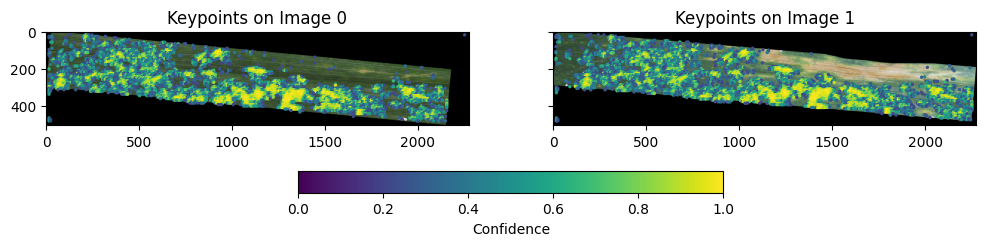

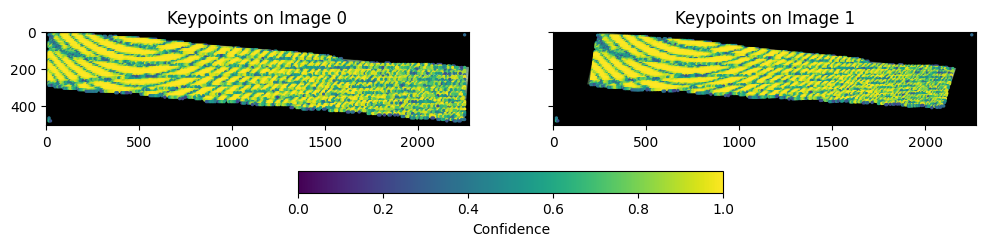

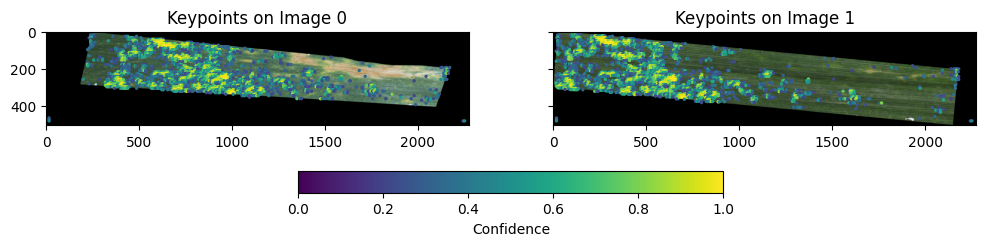

In [11]:
# 1 -> 2
mkpts12_1, mkpts12_2, confidence_12, inliers12,= loftr_match(img1, img2, verbose=True, return_n_matches=False)
_ = plot_match_coverage(img1, mkpts12_1, img2, mkpts12_2, confidence_12)
# 2 -> 3
mkpts23_2, mkpts23_3, confidence_23, inliers23,= loftr_match(img2, img3, verbose=True, return_n_matches=False)
_ = plot_match_coverage(img2, mkpts23_2, img3, mkpts23_3, confidence_23)
# 3 -> 1
mkpts31_3, mkpts31_1, confidence_31, inliers31,= loftr_match(img3, img1, verbose=True, return_n_matches=False)
_ = plot_match_coverage(img3, mkpts31_3, img1, mkpts31_1, confidence_31)

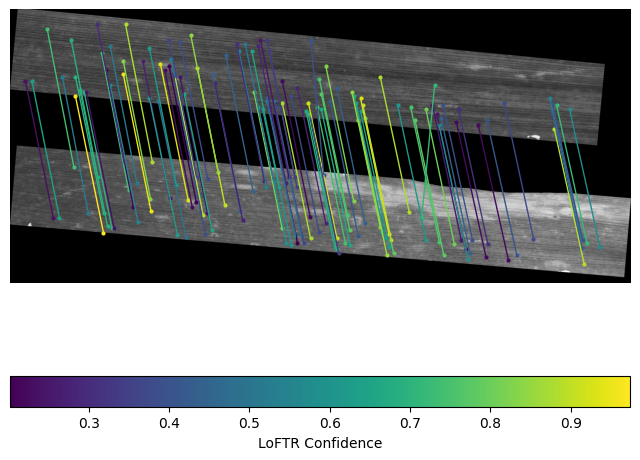

In [25]:
_=plot_matches_conf(img1, mkpts12_1[confidence_12>0.5], img2, mkpts12_2[confidence_12>0.5], confidence_12, N_show=100)

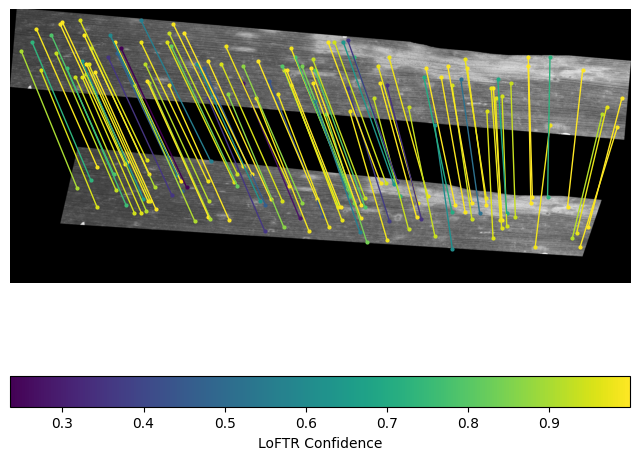

In [29]:
_=plot_matches_conf(img2, mkpts23_2[confidence_23>0.5], img3, mkpts23_3[confidence_23>0.5], confidence_23, N_show=100)

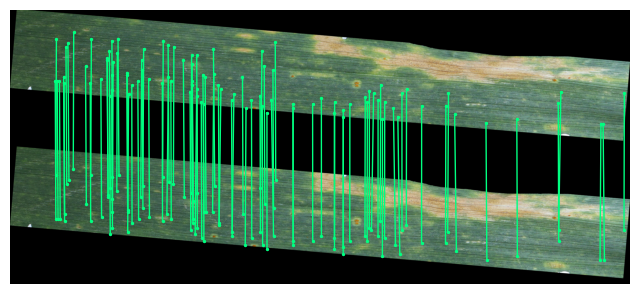

In [ ]:
nn_ind_2 = nearest_neighbors(mkpts12_2, mkpts23_2)

# movement of match from 1->2 to its nearest neighbor in 2->3
_=plot_matches(img2, mkpts12_2, img2, mkpts23_2[nn_ind_2], inliers12, N_show=100, inliers_only=True)

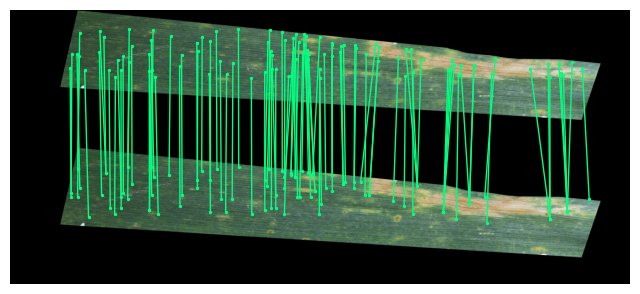

In [ ]:
nn_ind_3 = nearest_neighbors(mkpts23_3, mkpts31_3)
# movement of match from 2->3 to its nearest neighbor in 3->1
_=plot_matches(img3, mkpts23_3, img3, mkpts31_3[nn_ind_3], inliers12, N_show=100, inliers_only=True)

In [6]:
def plot_cycle_matches(img1, img2, img3, kpts12_1, kpts12_2, kpts23_2, kpts23_3, kpts31_3, kpts31_1, nearest_neighbors_img2, nearest_neighbors_img3, N_show=50):
    N_show = min(N_show, len(kpts12_1))
    show_idx = torch.randperm(len(kpts12_1))[:N_show]

    kpts12_1 = kpts12_1[show_idx]
    kpts12_2 = kpts12_2[show_idx]
    kpts23_2 = kpts23_2[nearest_neighbors_img2[show_idx]]
    kpts23_3 = kpts23_3[nearest_neighbors_img2[show_idx]]
    kpts31_3 = kpts31_3[nearest_neighbors_img3[nearest_neighbors_img2[show_idx]]]
    kpts31_1 = kpts31_1[nearest_neighbors_img3[nearest_neighbors_img2[show_idx]]]

    fig, ax = plt.subplots(figsize=(8,6))
    img_list = [img1, img2, img3, img1]
    img_set = np.concatenate([K.tensor_to_image(img1), K.tensor_to_image(img2), K.tensor_to_image(img3), K.tensor_to_image(img1)], axis=0)
    ax.imshow(img_set, cmap='gray')

    prev = 0
    for i in range(len(img_list)):
        ax.hlines(y=prev+img_list[i].shape[2], xmin=0, xmax=img_list[i].shape[3]-1, color='grey', linewidth=1)
        prev += img_list[i].shape[2]

    color = 'cyan'
    y_disp = 0
    for (x0, y0), (x1, y1) in zip(kpts12_1, kpts12_2):
        ax.scatter([x0, x1 ], [y0 + y_disp, y1 + y_disp + img1.shape[2]], color=color, s=2)
        ax.plot([x0, x1 ], [y0 + y_disp, y1 + y_disp + img1.shape[2]], color=color, linewidth=1)
    y_disp += img1.shape[2]

    for (x0, y0), (x1, y1) in zip(kpts12_2, kpts23_2):
        ax.plot([x0, x1 ], [y0 + y_disp, y1 + y_disp], color='white', linewidth=1)

    color = 'orange'
    for (x0, y0), (x1, y1) in zip(kpts23_2, kpts23_3):
        ax.scatter([x0, x1 ], [y0 + y_disp, y1 + y_disp + img2.shape[2]], color=color, s=2)
        ax.plot([x0, x1 ], [y0 + y_disp, y1 + y_disp + img2.shape[2]], color=color, linewidth=1)
    y_disp += img2.shape[2]

    for (x0, y0), (x1, y1) in zip(kpts23_3, kpts31_3):
        ax.plot([x0, x1 ], [y0 + y_disp, y1 + y_disp], color='white', linewidth=1)

    color = 'lime'
    for (x0, y0), (x1, y1) in zip(kpts31_3, kpts31_1):
        ax.scatter([x0, x1 ], [y0 + y_disp, y1 + y_disp + img3.shape[2]], color=color, s=2)
        ax.plot([x0, x1 ], [y0 + y_disp, y1 + y_disp + img3.shape[2]], color=color, linewidth=1)
    y_disp += img3.shape[2]

    for (x0, y0), (x1, y1) in zip(kpts31_1, kpts12_1):
        ax.plot([x0, x1 ], [y0 + y_disp, y1 + y_disp], color='white', linewidth=1)

    color = 'red'
    ax.scatter(kpts12_1[:,0], kpts12_1[:,1] + y_disp, color=color, s=2)

    ax.axis('off')
    plt.show()

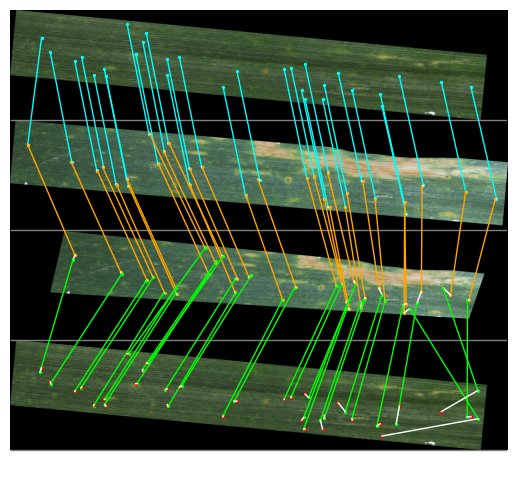

In [ ]:
plot_cycle_matches(img1, img2, img3, mkpts12_1, mkpts12_2, mkpts23_2, mkpts23_3, mkpts31_3, mkpts31_1, nn_ind_2, nn_ind_3, N_show=30)

In [34]:
# def cycle_matches(kpts12_1, kpts12_2, kpts23_2, kpts23_3, kpts31_3, kpts31_1):
def cycle_matches(kpts12_2, kpts23_2, kpts23_3, kpts31_3, kpts31_1, return_indices: bool=False):
    """
    Cycles from Img1 to Img2 to Img3, picking always to nearest neighbor from the new set of matches.

    Returns the matches in Img1 after they've made a full cycle
    """
    nearest_neighbors_img2 = nearest_neighbors(kpts12_2, kpts23_2)
    nearest_neighbors_img3 = nearest_neighbors(kpts23_3, kpts31_3)

    # kpts23_2 = kpts23_2[nearest_neighbors_img2]
    # kpts23_3 = kpts23_3[nearest_neighbors_img2]
    # kpts31_3 = kpts31_3[nearest_neighbors_img3[nearest_neighbors_img2]]
    kpts31_1 = kpts31_1[nearest_neighbors_img3[nearest_neighbors_img2]]
    if return_indices:
        return kpts31_1, nearest_neighbors_img2, nearest_neighbors_img3
    else:
        return kpts31_1

Number of consistent matches: 1243
Ratio of consistent matches: 0.275
Least confident of consistent matches: 0.201


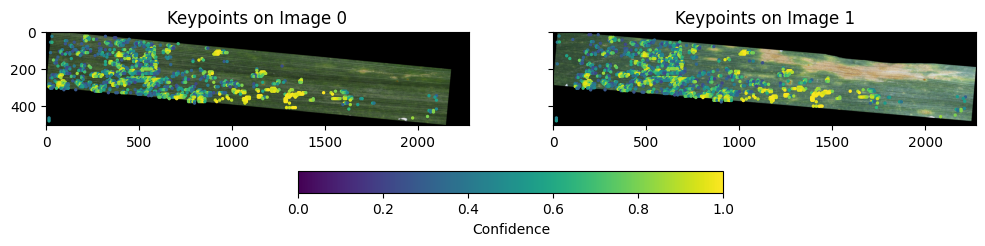

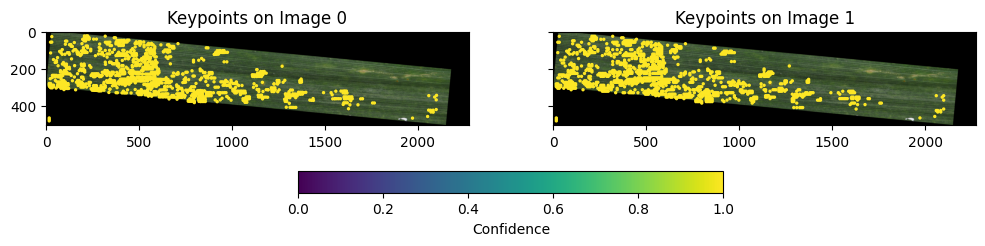

In [41]:
cycled_31_1 = cycle_matches(mkpts12_2, mkpts23_2, mkpts23_3, mkpts31_3, mkpts31_1)
dists = torch.norm(mkpts12_1 - cycled_31_1, dim=1)
tol = 5
is_consistent = (dists < tol)#.to(torch.float32)
print(f"Number of consistent matches: {int(is_consistent.sum())}")
print(f"Ratio of consistent matches: {is_consistent.to(torch.float32).mean():.3f}")
print(f"Least confident of consistent matches: {confidence_12[is_consistent].min():.3f}")
_ = plot_match_coverage(img1, mkpts12_1[is_consistent], img2, mkpts12_2[is_consistent], confidence_12[is_consistent])
_ = plot_match_coverage(img1, cycled_31_1[is_consistent], img1, mkpts12_1[is_consistent], is_consistent[is_consistent])


#### 3->1 vs 1->3

In [30]:
hom = RandomHomography(img_fixed.shape[2], img_fixed.shape[3], distortion_scale=0.4)
img1 = img_fixed
img2 = img_moving
img3 = hom.warp_image(img_moving)

Total matches: 1074
Matches with Confidence > 0.5: 369
Inliers: 479 (44.60%)


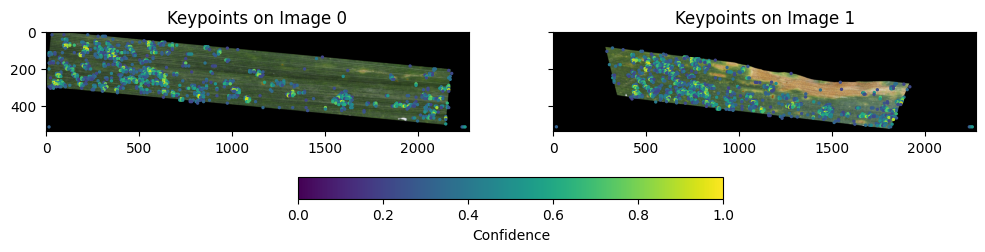

In [31]:
# get loftr matches 1 -> 3
mkpts13_1, mkpts13_3, confidence_13, inliers13,= loftr_match(img1, img3, verbose=True, return_n_matches=False)
_ = plot_match_coverage(img1, mkpts13_1, img3, mkpts13_3, confidence_13)

Total matches: 2488
Matches with Confidence > 0.5: 1276
Inliers: 1327 (53.34%)


Total matches: 6143
Matches with Confidence > 0.5: 5632
Inliers: 6103 (99.35%)
Total matches: 898
Matches with Confidence > 0.5: 280
Inliers: 396 (44.10%)


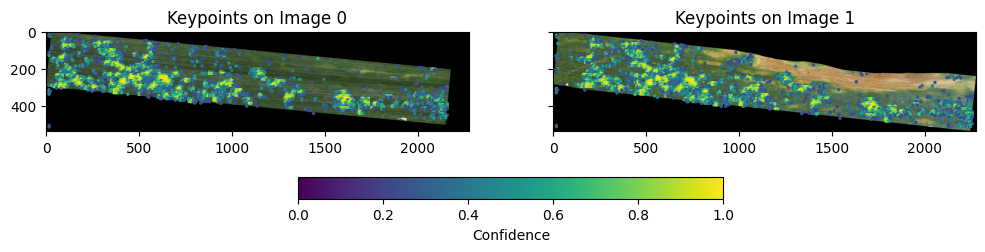

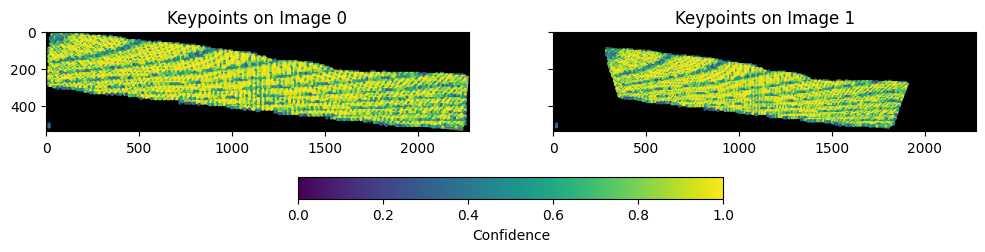

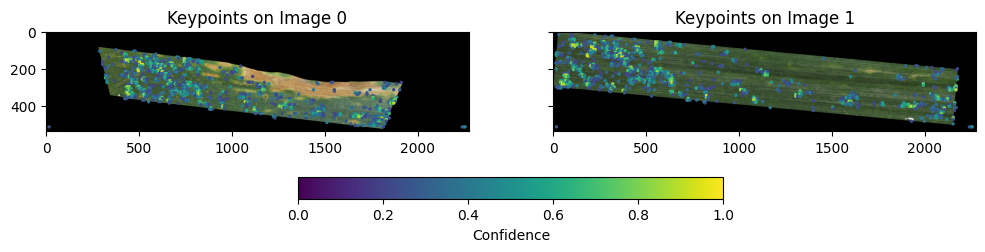

In [32]:
# 1 -> 2
mkpts12_1, mkpts12_2, confidence_12, inliers12,= loftr_match(img1, img2, verbose=True, return_n_matches=False)
_ = plot_match_coverage(img1, mkpts12_1, img2, mkpts12_2, confidence_12)
# 2 -> 3
mkpts23_2, mkpts23_3, confidence_23, inliers23,= loftr_match(img2, img3, verbose=True, return_n_matches=False)
_ = plot_match_coverage(img2, mkpts23_2, img3, mkpts23_3, confidence_23)
# 3 -> 1
mkpts31_3, mkpts31_1, confidence_31, inliers31,= loftr_match(img3, img1, verbose=True, return_n_matches=False)
_ = plot_match_coverage(img3, mkpts31_3, img1, mkpts31_1, confidence_31)

In [33]:
nn_ind_2 = nearest_neighbors(mkpts12_2, mkpts23_2)
nn_ind_13 = nearest_neighbors(mkpts23_3, mkpts13_3)

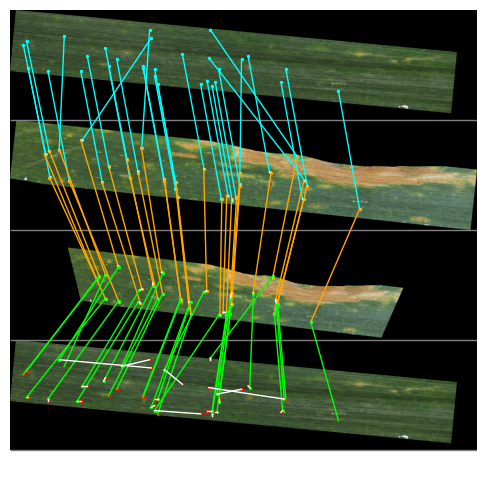

In [34]:
plot_cycle_matches(img1, img2, img3, mkpts12_1, mkpts12_2, mkpts23_2, mkpts23_3, mkpts13_3, mkpts13_1, nn_ind_2, nn_ind_13, N_show=30)

Number of consistent matches: 512
Ratio of consistent matches: 0.206
Least confident of consistent matches: 0.201


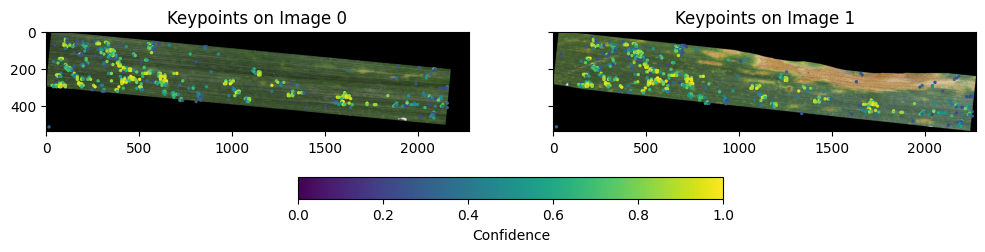

In [35]:
# 3 -> 1
cycled_31_1 = cycle_matches(mkpts12_2, mkpts23_2, mkpts23_3, mkpts31_3, mkpts31_1)
dists = torch.norm(mkpts12_1 - cycled_31_1, dim=1)
tol = 5
is_consistent = (dists < tol)#.to(torch.float32)
print(f"Number of consistent matches: {int(is_consistent.sum())}")
print(f"Ratio of consistent matches: {is_consistent.to(torch.float32).mean():.3f}")
print(f"Least confident of consistent matches: {confidence_12[is_consistent].min():.3f}")
_ = plot_match_coverage(img1, mkpts12_1[is_consistent], img2, mkpts12_2[is_consistent], confidence_12[is_consistent])
# _ = plot_match_coverage(img1, cycled_31_1[is_consistent], img1, mkpts12_1[is_consistent], is_consistent[is_consistent])

Number of consistent matches: 604
Ratio of consistent matches: 0.243
Least confident of consistent matches: 0.200


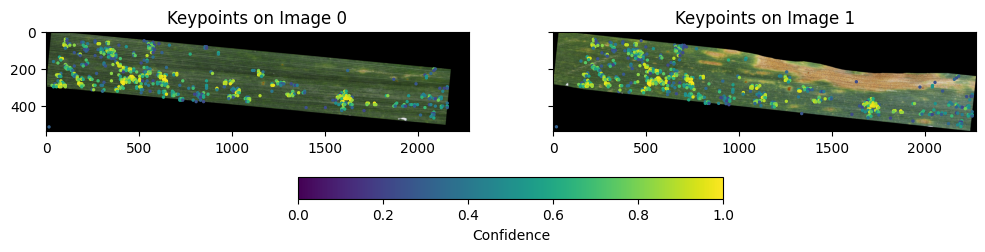

In [36]:
# 1 -> 3
cycled_13_1 = cycle_matches(mkpts12_2, mkpts23_2, mkpts23_3, mkpts13_3, mkpts13_1)
dists = torch.norm(mkpts12_1 - cycled_13_1, dim=1)
tol = 5
is_consistent = (dists < tol)#.to(torch.float32)
print(f"Number of consistent matches: {int(is_consistent.sum())}")
print(f"Ratio of consistent matches: {is_consistent.to(torch.float32).mean():.3f}")
print(f"Least confident of consistent matches: {confidence_12[is_consistent].min():.3f}")
_ = plot_match_coverage(img1, mkpts12_1[is_consistent], img2, mkpts12_2[is_consistent], confidence_12[is_consistent])
# _ = plot_match_coverage(img1, cycled_13_1[is_consistent], img1, mkpts12_1[is_consistent], is_consistent[is_consistent])


#### Masked LoFTR

In [61]:
import time
start = time.time()
_= loftr_match(img_fixed, img_moving, verbose=True, return_n_matches=False)
end = time.time()
print(f"Unmasked LoFTR Call: {end - start:.4f}s")

Total matches: 4524
Matches with Confidence > 0.5: 2638
Inliers: 2929 (64.74%)
Unmasked LoFTR Call: 4.0919s


In [ ]:
start = time.time()
_= loftr_match(img_moving, img_fixed, mask_fixed, mask_moving, verbose=True, return_n_matches=False)
end = time.time()
print(f"Masked LoFTR Call: {end - start:.4f}s")

Total matches: 4524
Matches with Confidence > 0.5: 2638
Inliers: 2929 (64.74%)
Masked LoFTR Call: 3.9459s


## Deterministic Transform

### Find Rotation of ROI

In [20]:
import cv2
from leafalignment.utils import extract_mask_boundary, affine_warp_expand

def find_roi_rotation(mask):
    bdry_pts = extract_mask_boundary(mask)[0] # get boundary points
    bdry_pts_np = bdry_pts.cpu().numpy().astype(np.float32) # convert to np for opencv

    # get the minimum-area bounding rectangle
    rect = cv2.minAreaRect(bdry_pts_np) # ((cx, cy), (y, x), angle)
    # angle is in degrees, range [-90, 0)

    # angle = rect[2]
    # y,x = rect[1]
    # cx, cy = rect[0]
    (cx, cy), (w, h), angle = rect
  
    if h > w:
        angle += 90  # rotate so long side along x-axis
    #     long_axis_len = h
    # else:
    #     long_axis_len = w

    return torch.tensor(angle)

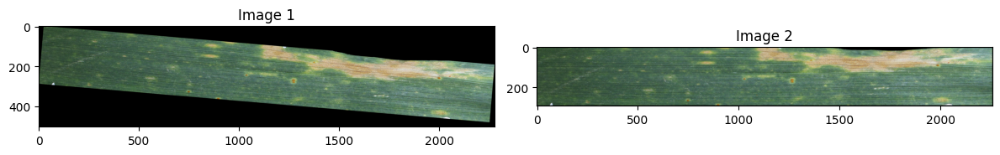

In [21]:
angle = find_roi_rotation(mask_moving)
out = affine_warp_expand(img_moving, mask_moving, rot_angle_deg=-angle)
_=plot_image_pair(img_moving, out["imgs"])

290.2979736328125 2257.51904296875
4.910041809082031


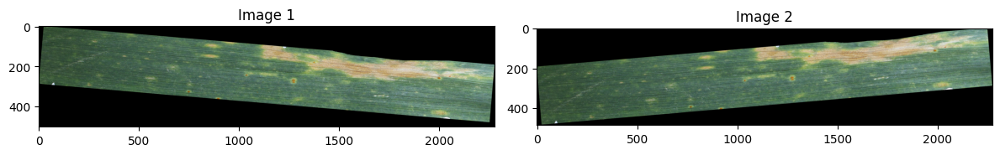

In [18]:
angle = find_roi_rotation(mask_moving)
out = affine_warp_expand(img_moving, mask_moving, rot_angle_deg=-2*angle)
_=plot_image_pair(img_moving, out["imgs"])

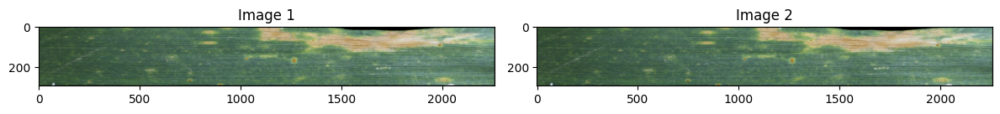

In [22]:
test_img = out["imgs"]
test_mask = out["masks"]
angle = find_roi_rotation(test_mask)
test_out = affine_warp_expand(test_img, test_mask, rot_angle_deg=-angle)
_=plot_image_pair(test_img, test_out["imgs"])

### Rotate

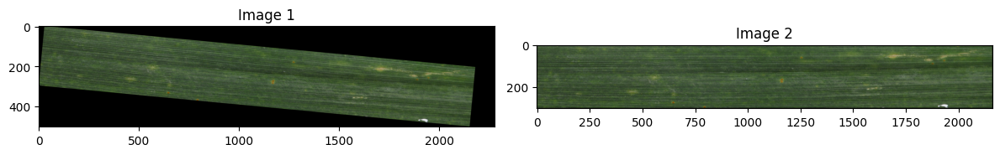

In [29]:
angle = find_roi_rotation(mask_fixed)
out = affine_warp_expand(img_fixed, mask_fixed, rot_angle_deg=-angle)
img1 = out["imgs"]
img1_mask = out["masks"]
_=plot_image_pair(img_fixed, img1)

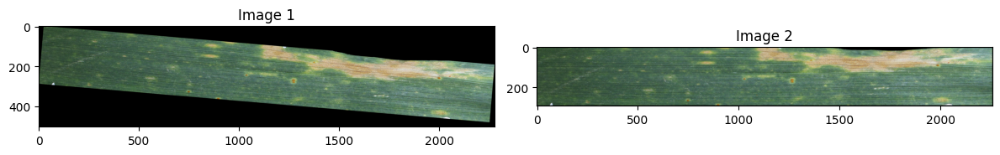

In [27]:
angle = find_roi_rotation(mask_moving)
out = affine_warp_expand(img_moving, mask_moving, rot_angle_deg=-angle)
img2 = out["imgs"]
img2_mask = out["masks"]
_=plot_image_pair(img_moving, img2)

In [30]:
out = affine_warp_expand(img2, img2_mask, rot_angle_deg=-10)
img3 = out["imgs"]

Total matches: 3410
Matches with Confidence > 0.5: 2146
Inliers: 1291 (37.86%)
Total matches: 8528
Matches with Confidence > 0.5: 7257
Inliers: 1851 (21.70%)
Total matches: 1925
Matches with Confidence > 0.5: 911
Inliers: 454 (23.58%)


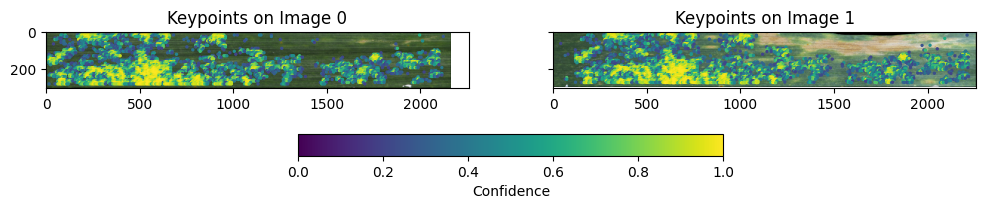

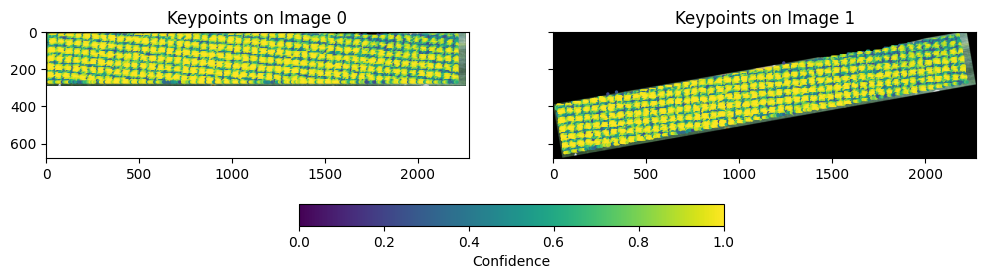

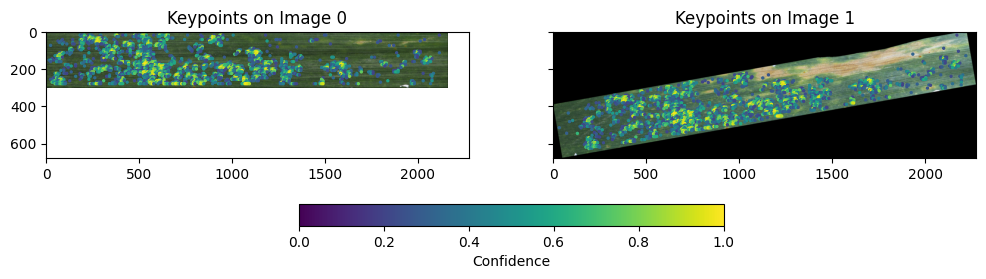

In [31]:
# 1 -> 2
mkpts12_1, mkpts12_2, confidence_12, inliers12,= loftr_match(img1, img2, verbose=True, return_n_matches=False)
_ = plot_match_coverage(img1, mkpts12_1, img2, mkpts12_2, confidence_12)
# 2 -> 3
mkpts23_2, mkpts23_3, confidence_23, inliers23,= loftr_match(img2, img3, verbose=True, return_n_matches=False)
_ = plot_match_coverage(img2, mkpts23_2, img3, mkpts23_3, confidence_23)
# 1 -> 3
mkpts13_1, mkpts13_3, confidence_13, inliers13,= loftr_match(img1, img3, verbose=True, return_n_matches=False)
_ = plot_match_coverage(img1, mkpts13_1, img3, mkpts13_3, confidence_13)

Number of consistent matches: 931
Ratio of consistent matches: 0.273
Least confident of consistent matches: 0.200


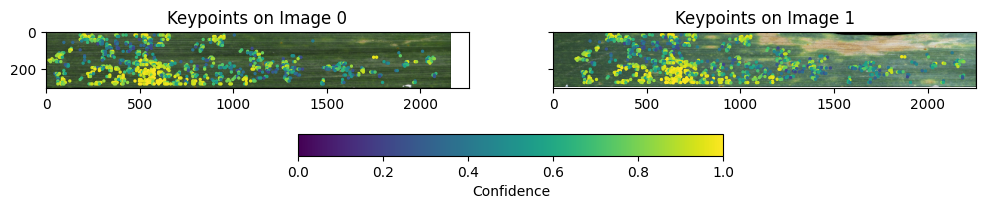

In [35]:
# 1 -> 3
cycled_13_1 = cycle_matches(mkpts12_2, mkpts23_2, mkpts23_3, mkpts13_3, mkpts13_1)
dists = torch.norm(mkpts12_1 - cycled_13_1, dim=1)
tol = 5
is_consistent = (dists < tol)#.to(torch.float32)
print(f"Number of consistent matches: {int(is_consistent.sum())}")
print(f"Ratio of consistent matches: {is_consistent.to(torch.float32).mean():.3f}")
print(f"Least confident of consistent matches: {confidence_12[is_consistent].min():.3f}")
_ = plot_match_coverage(img1, mkpts12_1[is_consistent], img2, mkpts12_2[is_consistent], confidence_12[is_consistent])
# _ = plot_match_coverage(img1, cycled_13_1[is_consistent], img1, mkpts12_1[is_consistent], is_consistent[is_consistent])

## Full Warp-Consistency Function

In [42]:
def warp_consistency(img_fixed, img_moving, plot_matches: bool=False, distortion_scale=0.4, tolerance=50, verbose: bool=False):
    hom = RandomHomography(img_fixed.shape[2], img_fixed.shape[3], distortion_scale=distortion_scale)

    # img1 = img_fixed
    # img2 = hom.warp_image(img_fixed)
    # img3 = img_moving

    img1 = img_fixed
    img2 = img_moving
    img3 =  hom.warp_image(img_moving)

    if verbose:
        print(f"Detecting LoFTR Matches...")
    # 1 -> 2
    mkpts12_1, mkpts12_2, confidence_12, _,= loftr_match(img1, img2, verbose=verbose, return_n_matches=False)
    # 2 -> 3
    mkpts23_2, mkpts23_3, confidence_23, _,= loftr_match(img2, img3, verbose=verbose, return_n_matches=False)
    # 3 -> 1
    mkpts31_3, mkpts31_1, confidence_31, _,= loftr_match(img3, img1, verbose=verbose, return_n_matches=False)
    if verbose:
        print(f"Img1 -> Img2: {len(mkpts12_1)} Matches")
        print(f"Img2 -> Img3: {len(mkpts23_2)} Matches")
        print(f"Img3 -> Img1: {len(mkpts31_3)} Matches")

    if plot_matches:
        _ = plot_match_coverage(img1, mkpts12_1, img2, mkpts12_2, confidence_12)
        _ = plot_match_coverage(img2, mkpts23_2, img3, mkpts23_3, confidence_23)
        _ = plot_match_coverage(img3, mkpts31_3, img1, mkpts31_1, confidence_31)


    if plot_matches:
        cycled_31_1, nn_ind_2, nn_ind_3 = cycle_matches(mkpts12_2, mkpts23_2, mkpts23_3, mkpts31_3, mkpts31_1, return_indices=True)
        plot_cycle_matches(img1, img2, img3, mkpts12_1, mkpts12_2, mkpts23_2, mkpts23_3, mkpts31_3, mkpts31_1, nn_ind_2, nn_ind_3, N_show=30)
    else:
        cycled_31_1 = cycle_matches(mkpts12_2, mkpts23_2, mkpts23_3, mkpts31_3, mkpts31_1)
    dists = torch.norm(mkpts12_1 - cycled_31_1, dim=1)
    is_consistent = (dists < tolerance)

    if plot_matches:
        print(f"Number of consistent matches: {int(is_consistent.sum())}")
        print(f"Ratio of consistent matches: {is_consistent.to(torch.float32).mean():.3f}")
        print(f"Least confident of consistent matches: {confidence_12[is_consistent].min():.3f}")
        _ = plot_match_coverage(img1, mkpts12_1[is_consistent], img2, mkpts12_2[is_consistent], confidence_12[is_consistent])
        # _ = plot_match_coverage(img1, cycled_31_1[is_consistent], img1, mkpts12_1[is_consistent], is_consistent[is_consistent])

    return mkpts12_1[is_consistent], mkpts12_2[is_consistent], confidence_12[is_consistent]


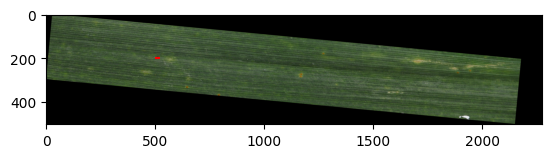

In [ ]:
# what should tolerance be?
delta=20
plt.imshow(K.tensor_to_image(img_fixed))
plt.hlines(y=200, xmin=500, xmax=500+delta, linewidth=1.5, color='red')
plt.show()

Detecting LoFTR Matches...
Total matches: 4524
Matches with Confidence > 0.5: 2638
Inliers: 2929 (64.74%)
Total matches: 7032
Matches with Confidence > 0.5: 6209
Inliers: 6882 (97.87%)
Total matches: 1423
Matches with Confidence > 0.5: 638
Inliers: 996 (69.99%)
Img1 -> Img2: 4524 Matches
Img2 -> Img3: 7032 Matches
Img3 -> Img1: 1423 Matches


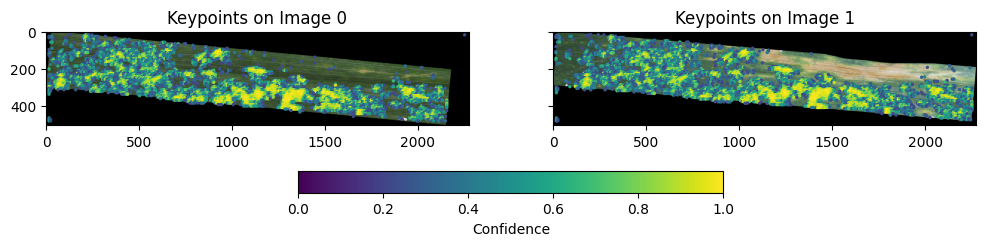

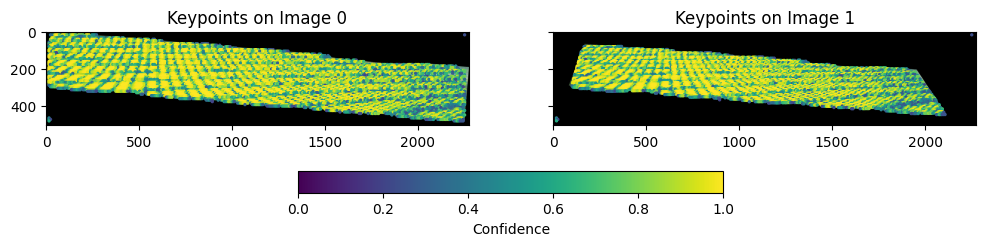

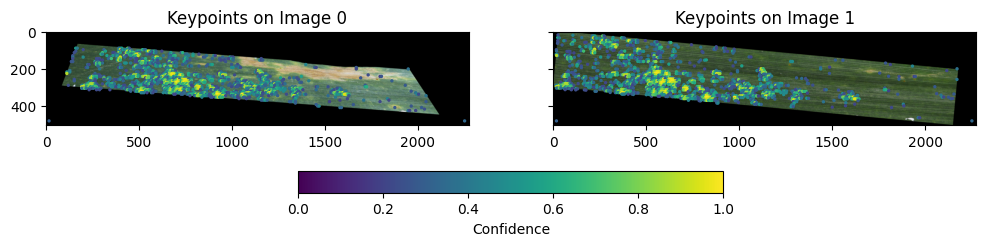

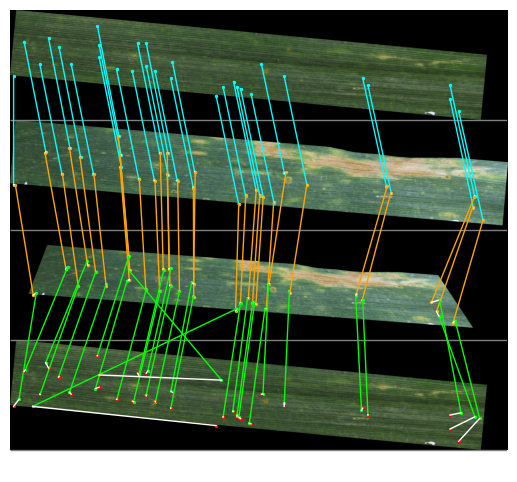

Number of consistent matches: 3062
Ratio of consistent matches: 0.677
Least confident of consistent matches: 0.200


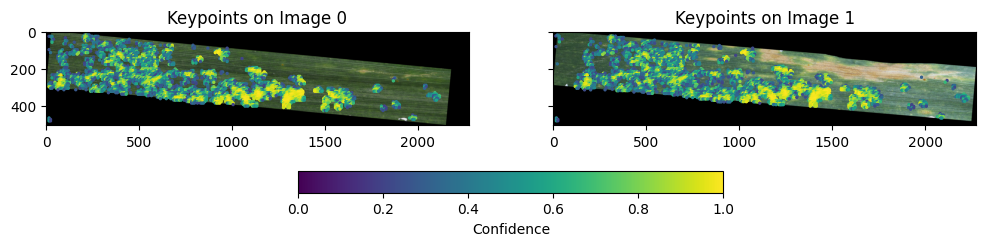

In [45]:
kpts1, kpts2, confidence = warp_consistency(img_fixed, img_moving, plot_matches=True, distortion_scale=0.4, tolerance=delta, verbose=True)

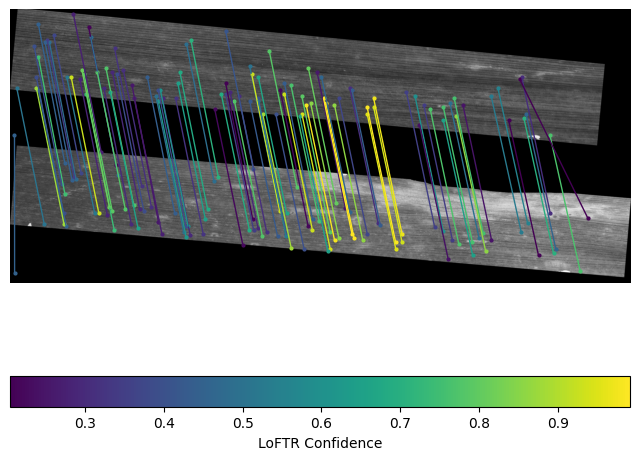

In [54]:
_=plot_matches_conf(img_fixed, kpts1, img_moving, kpts2, confidence, N_show=100)

### TPS Test

#### Example 1

In [63]:
kpts1_conf, kpts2_conf = filter_matches_by_confidence(kpts1, kpts2, confidence, verbose=True)
print(f"N_matches after filtering by confidence: {kpts1_conf.shape[0]}")

Threshold set to 0.5
N_matches after filtering by confidence: 476


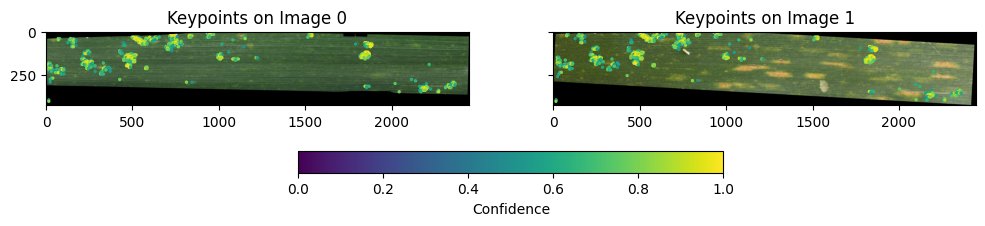

In [65]:
_=plot_match_coverage(img_fixed, kpts1_conf, img_moving, kpts2_conf, confidence[confidence>0.5])

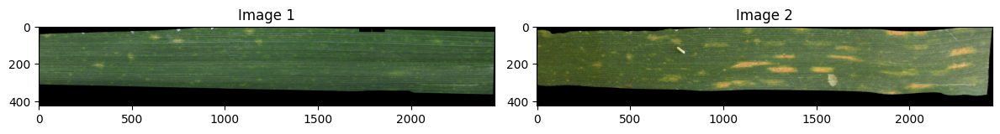

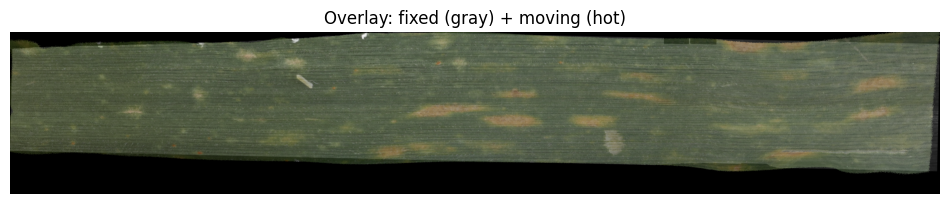

In [70]:
# out = torch_tps(kpts1_conf, kpts2_conf, img_moving, alpha=0.0, verbose=True)
alpha = 10.0
tps = fit_tps_torch(kpts1_conf, kpts2_conf, alpha=alpha)
out = warp_tps_torch(tps, img_moving)

_=plot_image_pair(img_fixed, out)
_=plot_overlay(img_fixed, out)

Total matches: 2208
Matches with Confidence > 0.5: 974
Inliers: 512 (23.19%)
Setting threshold..
Threshold set to 0.744
Fitting TPS...
Warping Moving Image...


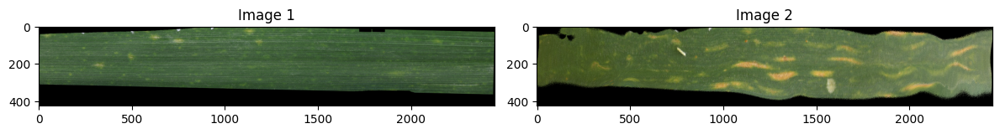

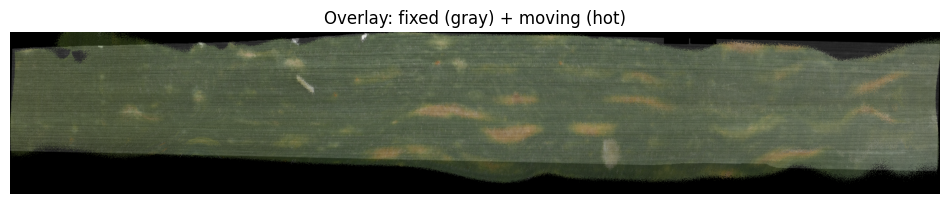

In [ ]:
# without verifing matches
from leafalignment.loftr import register_loftr_tps
out_prev = register_loftr_tps(img_fixed, img_moving, threshold=0.5, smoothing=alpha, mask_moving=None, verbose=True, plot_loftr_matches=False, return_tps=False)
_=plot_image_pair(img_fixed, out_prev)
_=plot_overlay(img_fixed, out_prev)

#### Example 2

In [55]:
kpts1_conf, kpts2_conf = filter_matches_by_confidence(kpts1, kpts2, confidence, verbose=True)
print(f"N_matches after filtering by confidence: {kpts1_conf.shape[0]}")

Setting threshold..
Threshold set to 0.91611392
N_matches after filtering by confidence: 393


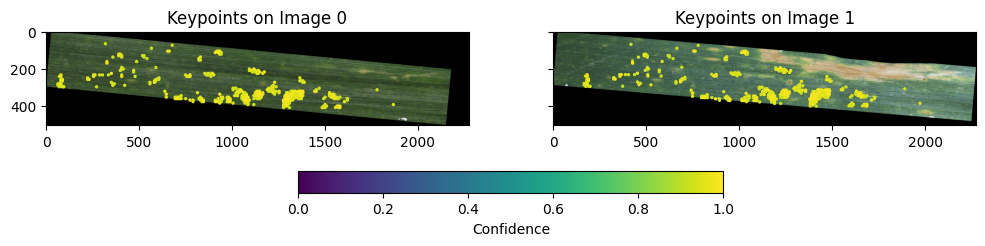

In [57]:
_=plot_match_coverage(img_fixed, kpts1_conf, img_moving, kpts2_conf, confidence[confidence>0.91611392])

Fitting TPS...
Warping Moving Image...


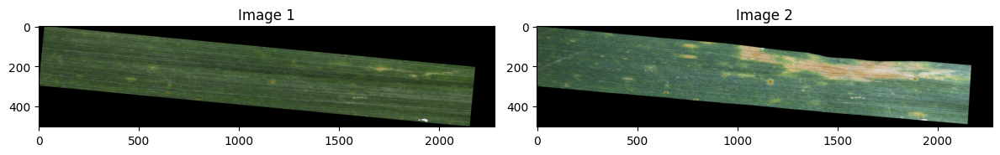

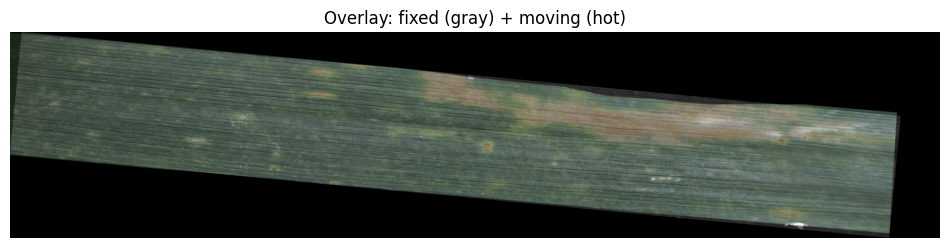

In [60]:
alpha = 10.0
out = torch_tps(kpts1_conf, kpts2_conf, img_moving, alpha=alpha, verbose=True)
# tps = fit_tps_torch(kpts1_conf, kpts2_conf, alpha=alpha)
# out = warp_tps_torch(tps, img_moving)

_=plot_image_pair(img_fixed, out)
_=plot_overlay(img_fixed, out)

Total matches: 4524
Matches with Confidence > 0.5: 2638
Inliers: 2929 (64.74%)
Setting threshold..
Threshold set to 0.9328911360000001
Fitting TPS...
Warping Moving Image...


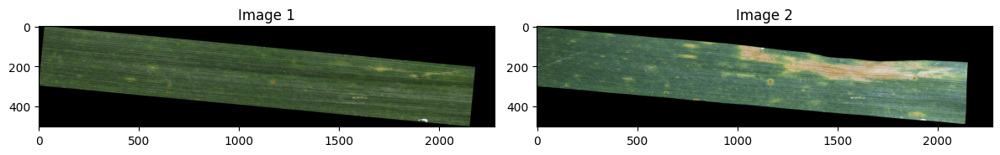

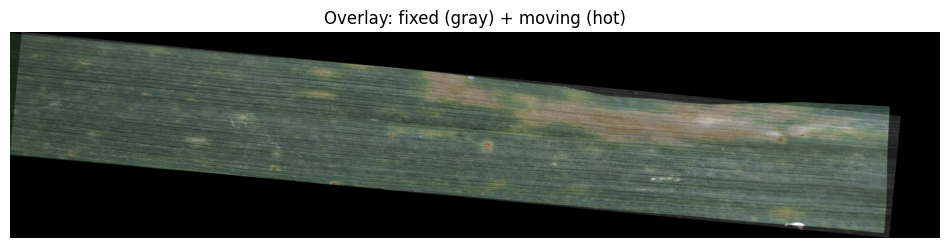

In [61]:
# without verifing matches
from leafalignment.loftr import register_loftr_tps
out_prev = register_loftr_tps(img_fixed, img_moving, threshold=0.5, smoothing=alpha, mask_moving=None, verbose=True, plot_loftr_matches=False, return_tps=False)
_=plot_image_pair(img_fixed, out_prev)
_=plot_overlay(img_fixed, out_prev)

#### Example 3

Detecting LoFTR Matches...
Total matches: 498
Matches with Confidence > 0.5: 168
Inliers: 178 (35.74%)
Total matches: 4960
Matches with Confidence > 0.5: 4424
Inliers: 4768 (96.13%)
Total matches: 192
Matches with Confidence > 0.5: 38
Inliers: 29 (15.10%)
Img1 -> Img2: 498 Matches
Img2 -> Img3: 4960 Matches
Img3 -> Img1: 192 Matches


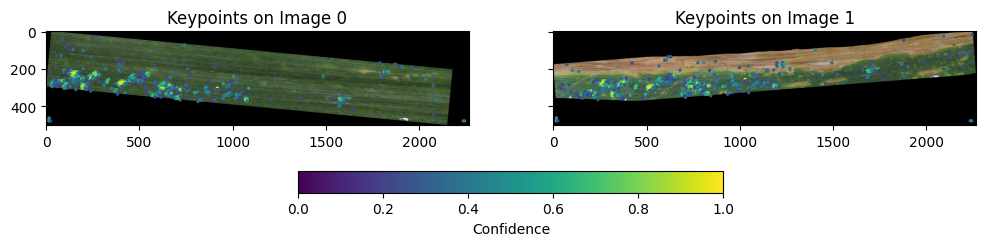

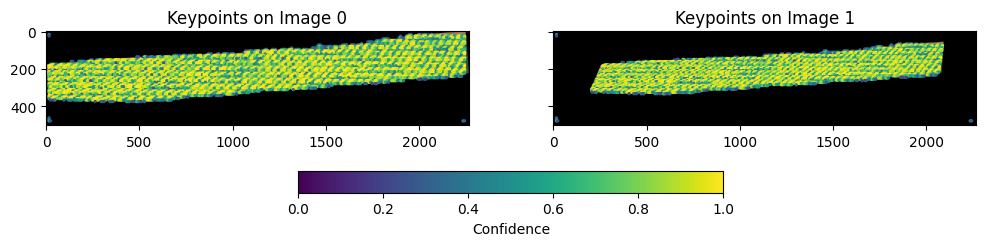

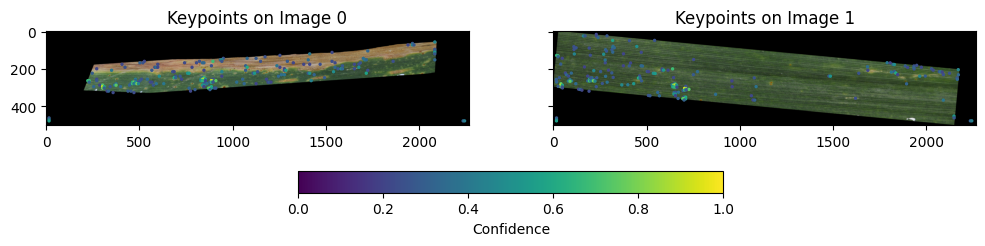

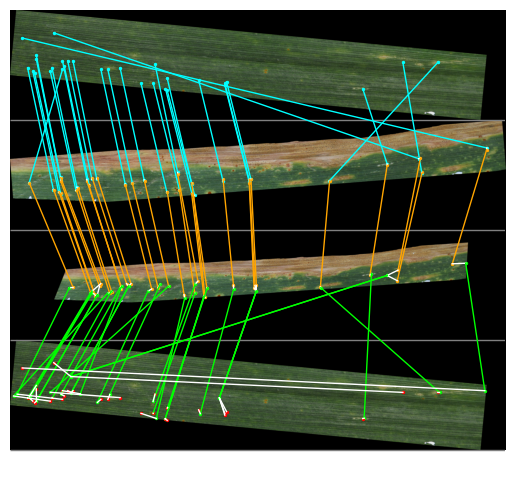

Number of consistent matches: 192
Ratio of consistent matches: 0.386
Least confident of consistent matches: 0.204


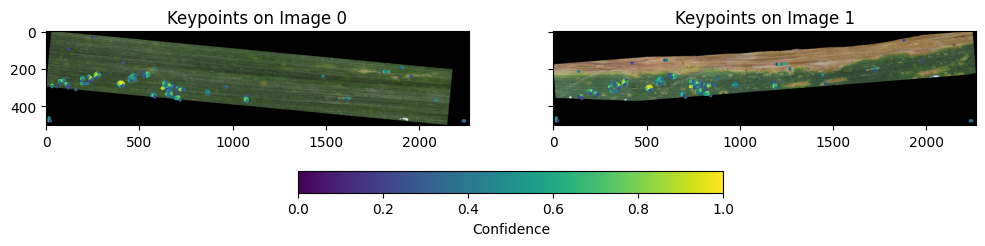

In [ ]:
delta = 20
kpts1, kpts2, confidence = warp_consistency(img_fixed, img_moving, plot_matches=True, distortion_scale=0.4, tolerance=delta, verbose=True)

In [64]:
kpts1_conf, kpts2_conf = filter_matches_by_confidence(kpts1, kpts2, confidence, verbose=True)
print(f"N_matches after filtering by confidence: {kpts1_conf.shape[0]}")

Threshold set to 0.5
N_matches after filtering by confidence: 86


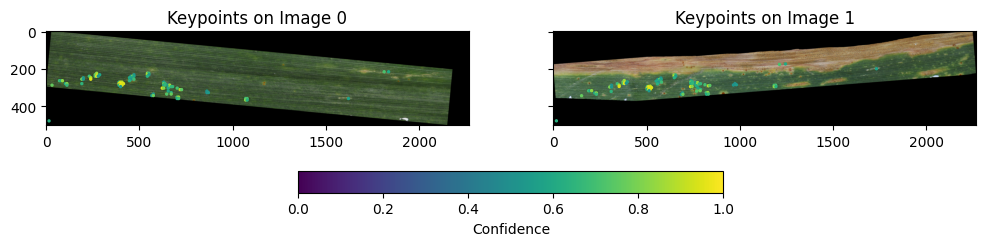

In [65]:
_=plot_match_coverage(img_fixed, kpts1_conf, img_moving, kpts2_conf, confidence[confidence>0.5])

Fitting TPS...
Warping Moving Image...


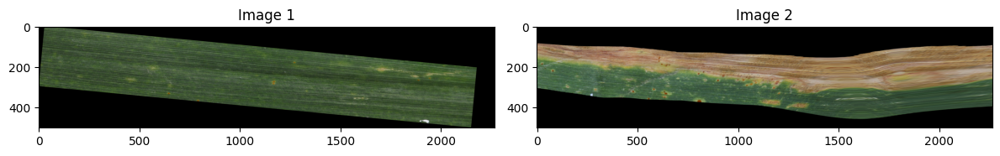

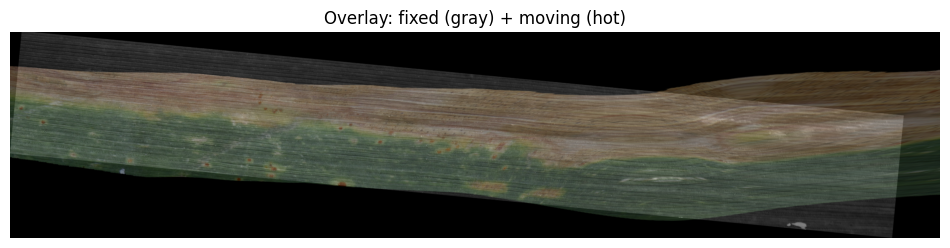

In [71]:
alpha = 0.0
out = torch_tps(kpts1_conf, kpts2_conf, img_moving, alpha=alpha, verbose=True)
# tps = fit_tps_torch(kpts1_conf, kpts2_conf, alpha=alpha)
# out = warp_tps_torch(tps, img_moving)

_=plot_image_pair(img_fixed, out)
_=plot_overlay(img_fixed, out)

Total matches: 498
Matches with Confidence > 0.5: 168
Inliers: 178 (35.74%)
Threshold set to 0.5
Fitting TPS...
Warping Moving Image...


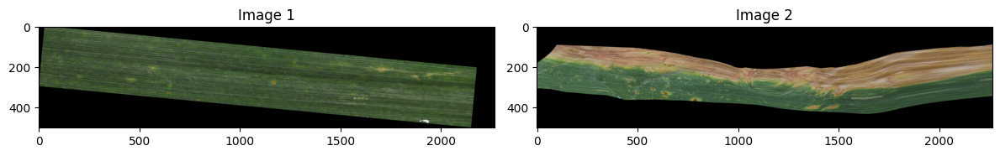

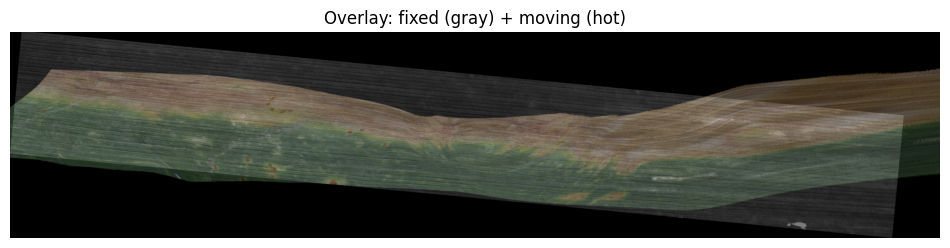

In [67]:
# without verifing matches
from leafalignment.loftr import register_loftr_tps
out_prev = register_loftr_tps(img_fixed, img_moving, threshold=0.5, smoothing=alpha, mask_moving=None, verbose=True, plot_loftr_matches=False, return_tps=False)
_=plot_image_pair(img_fixed, out_prev)
_=plot_overlay(img_fixed, out_prev)